# Sentiment analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import pickle
import nltk
from tqdm import tqdm
from transformers import AutoModelForSequenceClassification
from transformers import TFAutoModelForSequenceClassification
from transformers import AutoTokenizer, AutoConfig
from transformers import pipeline
from scipy.special import softmax
from sentence_transformers import SentenceTransformer, util
from scipy.interpolate import interp1d

sns.set(style="darkgrid")

nltk.download('punkt')

C:\Users\Mathieu\anaconda3\envs\ada_2\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Mathieu\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [2]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
#from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
#from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, silhouette_score

In [3]:
DATA_PATH = "../../../data/our_movie_data_extended.csv"
df_extended = pd.read_csv(DATA_PATH)[["Wikipedia_movie_ID", "summary", "category"]]
df_extended.dropna(subset=["summary"], inplace=True)
df_extended.sample(3)

,Wikipedia_movie_ID,summary,category
55527,24414526,"Jonas, a young drifter, is wandering in a dese...",['Drama']
66685,29473043,Pyar Hua Chori Chori is the story of a simple ...,['Romance']
27859,10495987,The story is about orphaned Raju a business m...,"['Comedy', 'Others', 'Musical']"


### Version of sentiment analysis using emotions and segments

In [4]:
device = 0 if torch.cuda.is_available() else 'cpu'

In [5]:
classifier = pipeline("text-classification", model="j-hartmann/emotion-english-distilroberta-base", return_all_scores=True, device=device)
sentence_model = SentenceTransformer('paraphrase-MiniLM-L6-v2', device=device)

big_df = pd.DataFrame()

limit = 2 # You can adjust the limit as needed
threshold = 0.5

#iterate over summaries
for idx, t in tqdm(df_extended['summary'].iloc[:limit].items(), total=len(df_extended['summary'].iloc[:limit])):
    sentences = nltk.sent_tokenize(t)
    embeddings = sentence_model.encode(sentences, convert_to_tensor=True)

    # Segment the text based on cosine similarity
    segments = []
    current_segment = [sentences[0]]

    for i in range(len(sentences) - 1):
        similarity = util.pytorch_cos_sim(embeddings[i], embeddings[i + 1]).item()

        if similarity < threshold:
            segments.append(" ".join(current_segment))
            current_segment = []

        current_segment.append(sentences[i + 1])

    #final segment join
    segments.append(" ".join(current_segment))

    # Classify the segments for emotions
    out = classifier(segments)
    emotions_flattened = [{item['label']: item['score'] for item in entry} for entry in out]
    emotions = pd.DataFrame(emotions_flattened)

    emotions['segment_id'] = [i for i in range(len(segments))]
    emotions['segment'] = [segments[i] for i in range(len(segments))]
    emotions['Wikipedia_movie_ID'] = [df_extended.iloc[idx]['Wikipedia_movie_ID']] * len(emotions)
    
    big_df = pd.concat([big_df, emotions], ignore_index=True)

print(big_df.shape)

C:\Users\Mathieu\anaconda3\envs\ada_2\Lib\site-packages\transformers\pipelines\text_classification.py:106: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(
100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.24it/s]

(19, 10)


### Version of sentiment analysis using sentences and emotions

In [6]:
classifier = pipeline("text-classification", model="j-hartmann/emotion-english-distilroberta-base", return_all_scores=True, device=device)
big_df = pd.DataFrame()

limit = 2 # You can adjust the limit as needed

for idx, t in tqdm(df_extended['summary'].iloc[:limit].items(), total=len(df_extended['summary'].iloc[:limit])):
    sentences = nltk.sent_tokenize(t)

    out = classifier(sentences)

    emotions_flattened = [{item['label']: item['score'] for item in entry} for entry in out]
    emotions = pd.DataFrame(emotions_flattened)

    emotions['sentence_id'] = [i for i in range(len(sentences))]
    emotions['sentence'] = [sentences[i] for i in range(len(sentences))]
    emotions['Wikipedia_movie_ID'] = [df_extended.iloc[idx]['Wikipedia_movie_ID']] * len(emotions) 

    big_df = pd.concat([big_df, emotions], ignore_index=True)
print(big_df.shape)

C:\Users\Mathieu\anaconda3\envs\ada_2\Lib\site-packages\transformers\pipelines\text_classification.py:106: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(
100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  2.12it/s]

(25, 10)


### Version of sentiment analysis using positive/negative only

In [7]:
MODEL = f"cardiffnlp/twitter-roberta-base-sentiment-latest"
tokenizer = AutoTokenizer.from_pretrained(MODEL)
config = AutoConfig.from_pretrained(MODEL)
model = AutoModelForSequenceClassification.from_pretrained(MODEL)
dict_labels = {0: 'negative', 1: 'neutral', 2: 'positive'}

big_df = pd.DataFrame()

limit = 10 # You can adjust the limit as needed

for idx, t in tqdm(df_extended['summary'].iloc[:limit].items(), total=len(df_extended['summary'].iloc[:limit])):
    sentences = nltk.sent_tokenize(t)
    for idx_s, s in enumerate(sentences):
        t_encoded = tokenizer(s, return_tensors='pt')
        t_output = model(**t_encoded)
        scores = softmax(t_output.logits.detach().numpy(), axis=1)
        
        emotions = pd.DataFrame(scores, columns=[dict_labels[i] for i in range(3)])
        emotions['sentence_id'] = idx_s
        emotions['Wikipedia_movie_ID'] = [df_extended.iloc[idx]['Wikipedia_movie_ID']] * len(emotions) 

        big_df = pd.concat([big_df, emotions], ignore_index=True)
print(big_df.shape)

Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:31<00:00,  3.19s/it]

(297, 5)


In [8]:
big_df.head(20)

,negative,neutral,positive,sentence_id,Wikipedia_movie_ID
0,0.005653,0.821786,0.172561,0,330
1,0.255226,0.724555,0.020220,0,3217
2,0.755420,0.235866,0.008714,1,3217
3,0.110220,0.838336,0.051444,2,3217
4,0.119391,0.574379,0.306231,3,3217
5,0.005951,0.482136,0.511913,4,3217
6,0.013369,0.838581,0.148051,5,3217
7,0.027470,0.903485,0.069045,6,3217
8,0.046110,0.917408,0.036482,7,3217
9,0.138054,0.813180,0.048766,8,3217


# Analyzing results

In [9]:
# Define the paths to the data files
DATA_PATH = "../../../data/sentence_emotions_5000.csv"  # Path to the CSV file containing sentence emotions data
DATA_PATH_MOVIE_METADATA = "../../../data/our_movie_data_extended.pkl"  # Path to the pickle file containing movie metadata

df_emotions = pd.read_csv(DATA_PATH)

with open(DATA_PATH_MOVIE_METADATA, 'rb') as f:
    df_metadata = pickle.load(f)

df_metadata.sample(3)

,Wikipedia_movie_ID,summary,Freebase_movie_ID,Movie_name,Movie_release_date,Movie_box_office_revenue,Movie_runtime,Movie_languages,Movie_countries,Movie_genres,category,continent
29467,11219515,Isahak is a fisherman with his heart in the r...,/m/02r40gv,Mahasamudram,2006.0,NaN,NaN,Malayalam Language,India,"Action, Drama","[Action/Adventure, Drama]",Asia
64881,28632743,NaN,/m/0czbllt,Naane Ennul Illai,2010.0,NaN,NaN,NaN,India,Romance Film,[Romance],Asia
21094,7635036,NaN,/m/0kvcwy,Luggage of the Gods!,1983.0,NaN,74.0,English Language,South Africa,Comedy,[Comedy],Africa


In [10]:
target_timesteps = 20  # Number of timesteps to which we want to interpolate the data
emotions = ["anger", "disgust", "fear", "joy", "neutral", "sadness", "surprise"] 

def interpolate_emotions(movie_data, target_timesteps):
    """
    Interpolates emotion values over a fixed number of timesteps for a given movie data.

    This function takes a DataFrame containing emotion values over time for a specific movie
    and interpolates each emotion to fit a fixed number of timesteps. This is useful for standardizing
    the data across movies with different numbers of timestamps, allowing for easier comparison.

    Args:
        movie_data (pd.DataFrame): A DataFrame containing emotion values for a specific movie.
            Each row represents a timestep, and columns should include:
            - "Wikipedia_movie_ID" (int or str): The unique identifier for the movie.
            - One column per emotion (e.g., "anger", "disgust", "fear", etc.).
        target_timesteps (int): The target number of timesteps for interpolation. The function
            will output a DataFrame with this fixed number of rows.

    Returns:
        pd.DataFrame: A DataFrame with `target_timesteps` rows, containing the interpolated
        emotion values. Columns include:
            - "Wikipedia_movie_ID" (int or str): Repeated ID of the movie for each row.
            - One column per emotion (e.g., "anger", "disgust", "fear", etc.) with interpolated values.
            
    Notes:
        - This function uses linear interpolation. For other types of interpolation,
          change the `kind` parameter in `interp1d`.
        - The function extrapolates values if the target positions extend beyond the range
          of `movie_data`.

    """
    # Define the original positions based on the length of the input data
    original_positions = np.arange(len(movie_data))
    # Define the target positions for interpolation based on the target timesteps
    target_positions = np.linspace(0, len(movie_data) - 1, target_timesteps)
    
    # Initialize a dictionary to store the interpolated data
    interpolated_data = {emotion: [] for emotion in emotions}
    # Add the Wikipedia_movie_ID to the dictionary, repeating it for each target timestep
    interpolated_data["Wikipedia_movie_ID"] = [movie_data["Wikipedia_movie_ID"].iloc[0]] * target_timesteps
    
    # Interpolate each emotion's values over the target positions
    for emotion in emotions:
        # Create a linear interpolation function for the current emotion
        interp_function = interp1d(original_positions, movie_data[emotion], kind="linear", fill_value="extrapolate")
        interpolated_data[emotion] = interp_function(target_positions)

    return pd.DataFrame(interpolated_data)

In [11]:
interpolated_movies = []

for movie_id, movie_data in df_emotions.groupby("Wikipedia_movie_ID"):
    # Apply the interpolate_emotions function to get a fixed number of timesteps for this movie
    interpolated_movie = interpolate_emotions(movie_data, target_timesteps)
    interpolated_movies.append(interpolated_movie)

interpolated_df = pd.concat(interpolated_movies, ignore_index=True)

# Add a timestep column to indicate the timestep index within each movie
interpolated_df['timestep'] = interpolated_df.groupby("Wikipedia_movie_ID").cumcount()
interpolated_df_wo_NA = interpolated_df.merge(df_metadata[['Wikipedia_movie_ID', 'continent']], on='Wikipedia_movie_ID')
#interpolated_df_wo_NA = interpolated_df_wo_NA[interpolated_df_wo_NA['continent'] != 'North America']
interpolated_df_wo_NA = interpolated_df_wo_NA[~interpolated_df_wo_NA['continent'].isin(['Europe', 'North America'])]

C:\Users\Mathieu\anaconda3\envs\ada_2\Lib\site-packages\scipy\interpolate\_interpolate.py:712: RuntimeWarning: invalid value encountered in divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]


In [12]:
# The NaN are due to the extrapolation on single sentence summaries (we should get rif of them and scrape)
interpolated_df.isna().sum()

anger                 760
disgust               760
fear                  760
joy                   760
neutral               760
sadness               760
surprise              760
Wikipedia_movie_ID      0
timestep                0
dtype: int64

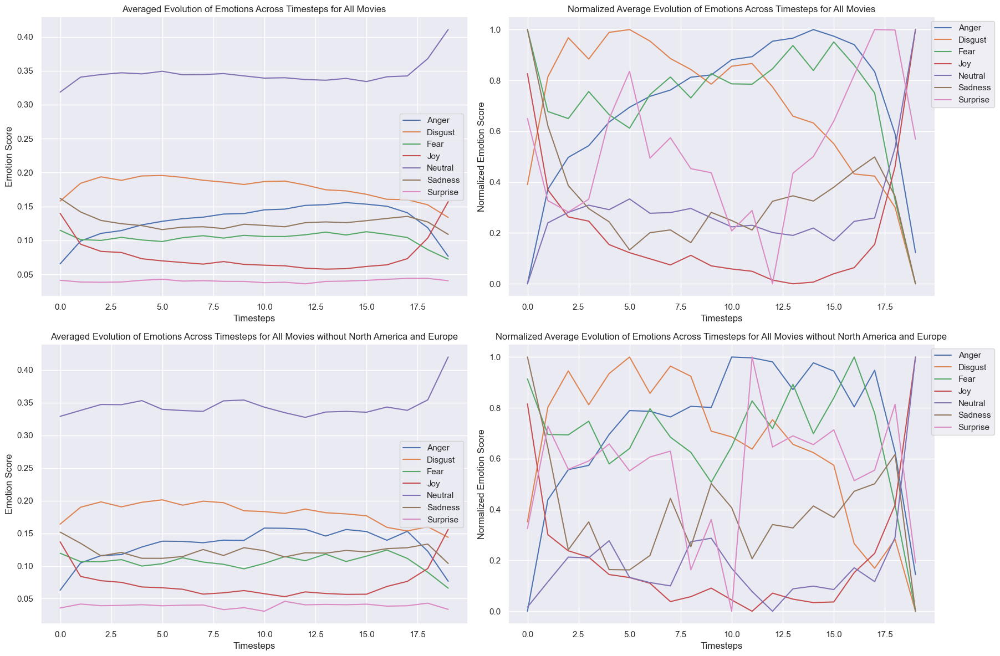

In [13]:
emotions = ['anger', 'disgust', 'fear', 'joy', 'neutral', 'sadness', 'surprise']
avg_emotions = interpolated_df.groupby("timestep")[emotions].mean()
avg_emotions_wo_america = interpolated_df_wo_NA.groupby("timestep")[emotions].mean()

#avg_emotions = avg_emotions[:target_timesteps]

#MinMax Normalization
normalized_emotions = avg_emotions.apply(lambda x: (x - x.min()) / (x.max() - x.min()), axis=0)
normalized_emotions_wo_america = avg_emotions_wo_america.apply(lambda x: (x - x.min()) / (x.max() - x.min()), axis=0)

#ZScore Normalization
fig, axes = plt.subplots(2, 2,figsize=(18, 12))
axes = axes.ravel()
for emotion in emotions:
    axes[0].plot(range(target_timesteps), avg_emotions[emotion], label=emotion.capitalize())
    axes[1].plot(range(target_timesteps), normalized_emotions[emotion], label=emotion.capitalize())
    axes[2].plot(range(target_timesteps), avg_emotions_wo_america[emotion], label=emotion.capitalize())
    axes[3].plot(range(target_timesteps), normalized_emotions_wo_america[emotion], label=emotion.capitalize())
axes[0].set_title("Averaged Evolution of Emotions Across Timesteps for All Movies")
axes[0].set_xlabel("Timesteps")
axes[0].set_ylabel("Emotion Score")
axes[0].legend(loc="best")
axes[1].set_title("Normalized Average Evolution of Emotions Across Timesteps for All Movies")
axes[1].set_xlabel("Timesteps")
axes[1].set_ylabel("Normalized Emotion Score")
axes[1].legend(loc="upper right", bbox_to_anchor=(1.15, 1))
axes[2].set_title("Averaged Evolution of Emotions Across Timesteps for All Movies without North America and Europe")
axes[2].set_xlabel("Timesteps")
axes[2].set_ylabel("Emotion Score")
axes[2].legend(loc="best")
axes[3].set_title("Normalized Average Evolution of Emotions Across Timesteps for All Movies without North America and Europe")
axes[3].set_xlabel("Timesteps")
axes[3].set_ylabel("Normalized Emotion Score")
axes[3].legend(loc="best", bbox_to_anchor=(1.15, 1))
plt.tight_layout()
plt.show()

### Now we can try for movies in already formed genres

In [14]:
df_exploded = interpolated_df.merge(df_metadata[["Wikipedia_movie_ID", "category"]], on="Wikipedia_movie_ID")
# create 1 row per movie per genre (so if a film is associated to 3 genres, it will have 3 rows)
df_exploded = df_exploded.explode("category")

df_exploded_wo_NA = df_exploded.merge(df_metadata[["Wikipedia_movie_ID", "continent"]], on="Wikipedia_movie_ID")
df_exploded_wo_NA = df_exploded_wo_NA[df_exploded_wo_NA['continent'] != 'North America'].drop('continent', axis=1).explode('category')
# Compute the mean of emotions per category and per timestep
df_grouped_by_genre = df_exploded.groupby(["category", "timestep"])[emotions].mean()
#df_grouped_by_genre
df_grouped_by_genre_wo_NA = df_exploded_wo_NA.groupby(["category", "timestep"])[emotions].mean()


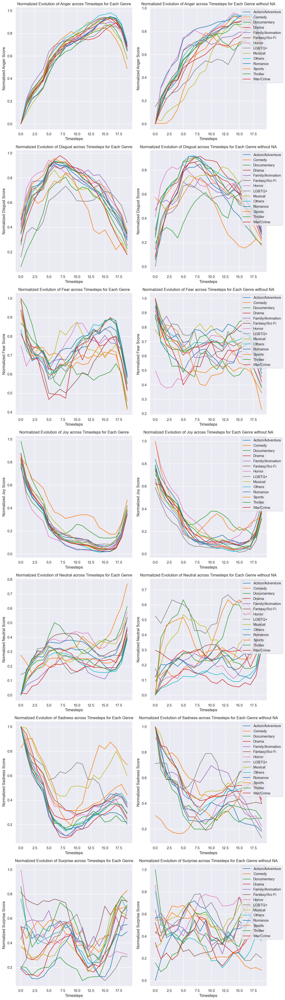

In [15]:
# Define a rolling window size for smoothing
window_size = 5
_, axes = plt.subplots(len(emotions), 2, figsize=(12, len(emotions)*6))
#axes = axes.ravel()
                       
for idx, emotion in enumerate(emotions):
    
    # Pivot the DataFrame to have genres as columns and timesteps as the index for the current emotion
    avg_emotion_by_genre = df_grouped_by_genre[emotion].unstack(level=0)
    avg_emotion_by_genre_wo_NA = df_grouped_by_genre_wo_NA[emotion].unstack(level=0)
                       
    # Normalize each genre's emotion scores across timesteps (min-max normalization)
    avg_emotion_by_genre = avg_emotion_by_genre.apply(lambda x: (x - x.min()) / (x.max() - x.min()), axis=0)
    avg_emotion_by_genre_wo_NA = avg_emotion_by_genre_wo_NA.apply(lambda x: (x - x.min()) / (x.max() - x.min()), axis=0)
    
    # Apply rolling mean to smooth the emotion data over the defined window size
    smoothed_avg_emotion_by_genre = avg_emotion_by_genre.rolling(window=window_size, min_periods=1).mean()
    smoothed_avg_emotion_by_genre_wo_NA = avg_emotion_by_genre_wo_NA.rolling(window=window_size, min_periods=1).mean()

    palette = sns.color_palette("tab10", len(smoothed_avg_emotion_by_genre.columns)) 
    for jdx, genre in enumerate(smoothed_avg_emotion_by_genre.columns):
        sns.lineplot(
            x=smoothed_avg_emotion_by_genre.index,
            y=smoothed_avg_emotion_by_genre[genre],
            ax=axes[idx, 0],
            color=palette[jdx]  
        )

        sns.lineplot(
            x=smoothed_avg_emotion_by_genre_wo_NA.index,
            y=smoothed_avg_emotion_by_genre_wo_NA[genre],
            ax=axes[idx, 1],
            label=genre,
            color=palette[jdx]  
        )
    
    axes[idx, 0].set_title(f"Normalized Evolution of {emotion.capitalize()} across Timesteps for Each Genre")
    axes[idx, 0].set_xlabel("Timesteps")
    axes[idx, 0].set_ylabel(f"Normalized {emotion.capitalize()} Score")
    
    
    axes[idx, 1].set_title(f"Normalized Evolution of {emotion.capitalize()} across Timesteps for Each Genre without NA")
    axes[idx, 1].set_xlabel("Timesteps")
    axes[idx, 1].set_ylabel(f"Normalized {emotion.capitalize()} Score")
    axes[idx, 1].legend(loc="upper right", bbox_to_anchor=(1.15, 1))
    
plt.tight_layout()
plt.show()

In [16]:
continents = ['Africa', 'Asia', 'Europe', 'North America', 'Oceania', 'South America']

df_exploded = interpolated_df.merge(df_metadata[["Wikipedia_movie_ID", "category", "continent"]], on="Wikipedia_movie_ID")

# Explode the "category" column to separate rows if a movie has multiple categories
df_exploded = df_exploded.explode("category")
# Group by "continent", "category", and "timestep" to analyze emotions by continent and genre over time
df_groupy_by_continent = df_exploded.groupby(["continent", "category", "timestep"])[emotions].mean()

In [17]:
# Assign individual DataFrames to variables for each continent for easy access
africa_df =  df_groupy_by_continent.xs('Africa', level='continent')
asia_df = df_groupy_by_continent.xs('Asia', level='continent')
europe_df = df_groupy_by_continent.xs('Europe', level='continent')
na_df = df_groupy_by_continent.xs('North America', level='continent')
oceania_df = df_groupy_by_continent.xs('Oceania', level='continent')
sa_df = df_groupy_by_continent.xs('South America', level='continent')

# Create a list containing all the continent-specific DataFrames for convenience
dfs = [africa_df, asia_df, europe_df, na_df, oceania_df, sa_df]

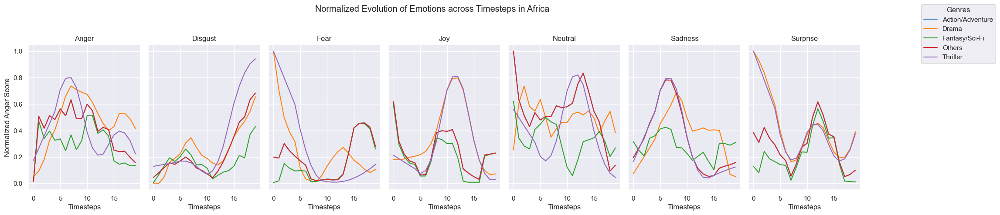

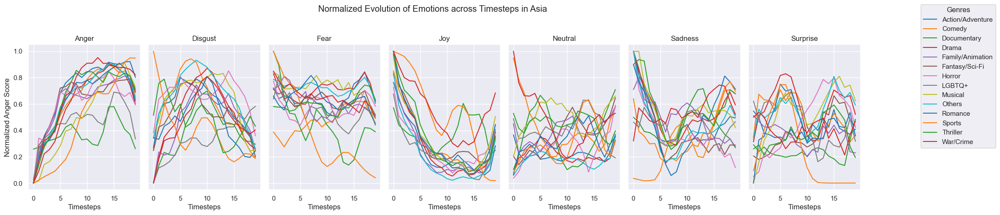

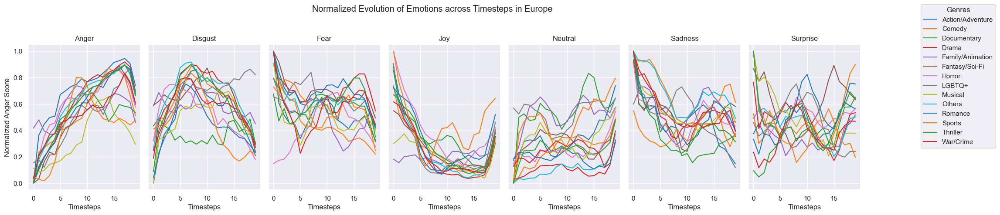

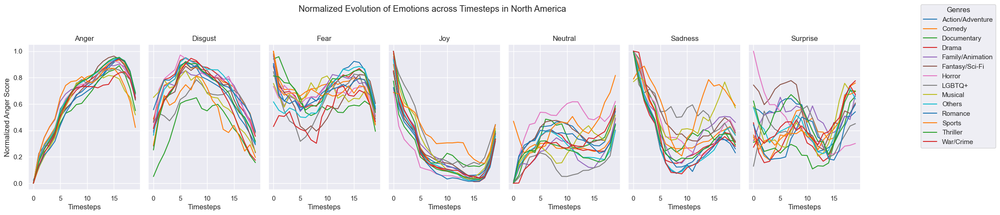

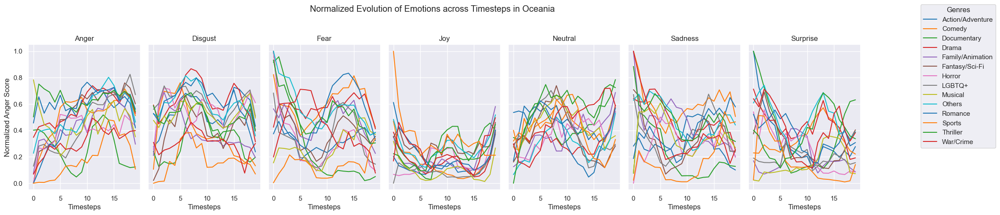

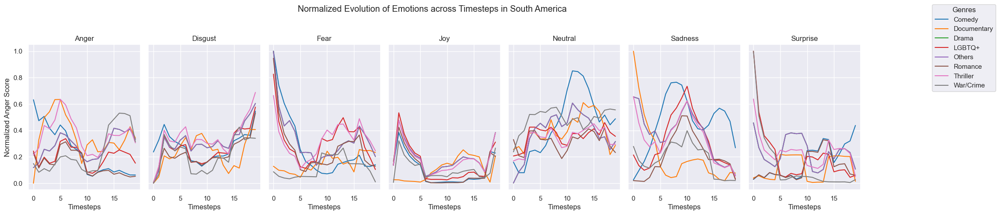

In [18]:

for continent_name, df_continent in zip(continents, dfs):
    fig, axes = plt.subplots(1, 7, figsize=(20, 5), sharex=True, sharey=True)
    fig.suptitle(f"Normalized Evolution of Emotions across Timesteps in {continent_name}")

    handles = []
    labels = []
    legend_created = False

    for ax, emotion in zip(axes, emotions):
        # Reshape the data for the current emotion by genre
        avg_emotion_by_genre = df_continent[emotion].unstack(level=0)

        # Normalize each genre's emotion values (min-max normalization)
        avg_emotion_by_genre = avg_emotion_by_genre.apply(lambda x: (x - x.min()) / (x.max() - x.min()), axis=0)

        # Apply a rolling mean to smooth the data over the defined window size
        smoothed_avg_emotion_by_genre = avg_emotion_by_genre.rolling(window=window_size, min_periods=1).mean()
        
        palette = sns.color_palette("tab10", len(smoothed_avg_emotion_by_genre.columns)) 
        # Plot each genre's emotion evolution on the corresponding subplot
        for jdx, genre in enumerate(smoothed_avg_emotion_by_genre.columns):
            sns.lineplot(
                x=smoothed_avg_emotion_by_genre.index,
                y=smoothed_avg_emotion_by_genre[genre],
                ax=ax,
                label=genre,
                color=palette[jdx]
            )

        # Capture legend handles and labels only once
        if not legend_created:
            h, l = ax.get_legend_handles_labels()
            handles.extend(h)
            labels.extend(l)
            legend_created = True

        # Remove the subplot legend to avoid redundancy (it will be added globally later)
        ax.get_legend().remove()

        # Set the title and labels for each subplot
        ax.set_title(emotion.capitalize())
        ax.set_xlabel("Timesteps")
        ax.set_ylabel(f"Normalized {emotion.capitalize()} Score")

    # Add a single legend for all genres, positioned outside the figure
    fig.legend(handles, labels, loc="upper right", bbox_to_anchor=(1.15, 1), title="Genres")

    plt.tight_layout(rect=[0, 0, 1, 0.95]) 
    plt.show()

## using box office now

use the dataset without much cleaning to see if we can predict something with the data

In [19]:
# Group by 'Wikipedia_movie_ID' and calculate the mean of every emotion per film
df_boxoffice = interpolated_df.groupby('Wikipedia_movie_ID').mean()

# Merge with metadata to add movie-specific attributes such as category, box office revenue, runtime, and release date
df_boxoffice = df_boxoffice.merge(
    df_metadata[["Wikipedia_movie_ID", "category", "Movie_box_office_revenue", "Movie_runtime", "Movie_release_date", "continent"]],
    on="Wikipedia_movie_ID"
)

# Drop rows with any missing values to ensure only complete data rows are kept
df_boxoffice = df_boxoffice.dropna(axis=0)
df_boxoffice.sample(3)

,Wikipedia_movie_ID,anger,disgust,fear,joy,neutral,sadness,surprise,timestep,category,Movie_box_office_revenue,Movie_runtime,Movie_release_date,continent
2840,1156559,0.093577,0.073209,0.092846,0.021170,0.483513,0.138987,0.096698,9.5,"[Comedy, Drama, Others]",8679814.0,89.0,2003.0,North America
3047,1250208,0.027123,0.142889,0.052239,0.016545,0.657732,0.018352,0.085120,9.5,"[Action/Adventure, Comedy, Family/Animation, O...",59927618.0,105.0,1997.0,North America
3792,1653220,0.214441,0.135011,0.096788,0.012464,0.326011,0.205600,0.009684,9.5,"[Thriller, Others, Drama, Fantasy/Sci-Fi]",30919415.0,101.0,2001.0,North America


In [20]:
#separate X and y for the train test split. 
#We keep category for y, so we can explose y_train and y_test after the split on the category
X = df_boxoffice.drop(columns=["Movie_box_office_revenue", 'Wikipedia_movie_ID', 'timestep'])
y = pd.DataFrame(df_boxoffice[["Movie_box_office_revenue", "category"]])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42) #test_size = 0.15 yiels better r2 score than .2
# One-hot encode the 'category' column in the training data to handle categorical genres
X_train = pd.get_dummies(X_train.explode('category'), columns=['category'])
X_train = pd.get_dummies(X_train, columns=['continent'])
# Only keep the boxoffice for y as it is the only thing that interest us here
y_train = pd.get_dummies(y_train.explode('category'), columns=['category'])['Movie_box_office_revenue']
X_test = pd.get_dummies(X_test.explode('category'), columns=['category'])
X_test = pd.get_dummies(X_test, columns=['continent'])
y_test = pd.get_dummies(y_test.explode('category'), columns=['category'])['Movie_box_office_revenue']
X_train = X_train[X_test.columns]

In [21]:
# Define a pipeline with two main steps: scaling and regression
pipeline = Pipeline([
    ("scaler", StandardScaler()),  # Step 1: Standardize features
    ("regressor", RandomForestRegressor(random_state=42))  # Step 2: Random Forest Regressor
])
pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

In [22]:
#compute some metrics about the model
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error (MAE):", mae)

mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error (MSE):", mse)

rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)

r2 = r2_score(y_test, y_pred)
print("R-squared (R²):", r2)
mean_boxoffice = y_test.mean()
print(f"mean of boxoffice = {round(mean_boxoffice, 2)}")
std_boxoffice = y_test.std()
print(f"std of boxoffice = {round(std_boxoffice, 2)}")

Mean Absolute Error (MAE): 88900008.72168583
Mean Squared Error (MSE): 2.0533941928923532e+16
Root Mean Squared Error (RMSE): 143296691.9678313
R-squared (R²): 0.12418920014776769
mean of boxoffice = 88932745.28
std of boxoffice = 153193067.24


We can see that with a simple model, we cannot predict really well the boxoffice

Text(0.5, 0, 'Boxoffice revenue in dollars')

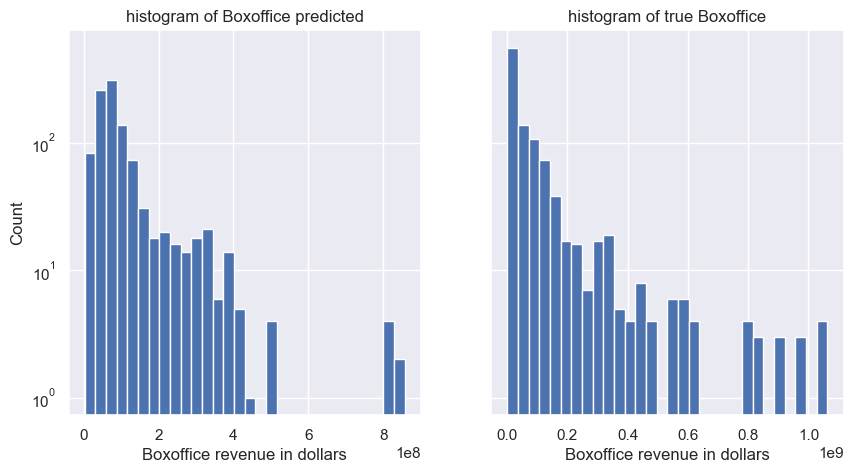

In [23]:
#plot the histogram of the prediction and the true value on a log scale
_, axes = plt.subplots(1, 2, sharey=True,figsize=(10, 5))
axes = axes.ravel()
axes[0].hist(y_pred, bins=30)
axes[0].set_title('histogram of Boxoffice predicted')
axes[0].set_ylabel('Count')
axes[0].set_xlabel('Boxoffice revenue in dollars')
axes[0].set_yscale('log')
axes[1].hist(y_test,bins=30)
axes[1].set_title('histogram of true Boxoffice')
axes[1].set_xlabel('Boxoffice revenue in dollars')

### Plot the boxoffice of every genre for every continent


In [24]:
#As we care only about the boxoffice, and we have 20 timesteps/film, we take only 1 film every 20.
df_boxoffice = interpolated_df.iloc[::20].merge(df_metadata[["Wikipedia_movie_ID","category", "continent", "Movie_box_office_revenue"]], on="Wikipedia_movie_ID")
#drop every rows (movies) that does not have the box_office
df_boxoffice = df_boxoffice.dropna(subset=['Movie_box_office_revenue'], axis=0)[['category', 'continent', 'Movie_box_office_revenue']]
df_boxoffice = df_boxoffice.explode('category')
#compute the mean per category per continent
df_boxoffice_mean_by_category_and_genre = df_boxoffice.groupby(['category', 'continent']).mean()

In [25]:
df_boxoffice_mean_by_category_and_genre =df_boxoffice_mean_by_category_and_genre.reset_index()
continents = np.unique(df_boxoffice_mean_by_category_and_genre['continent'])

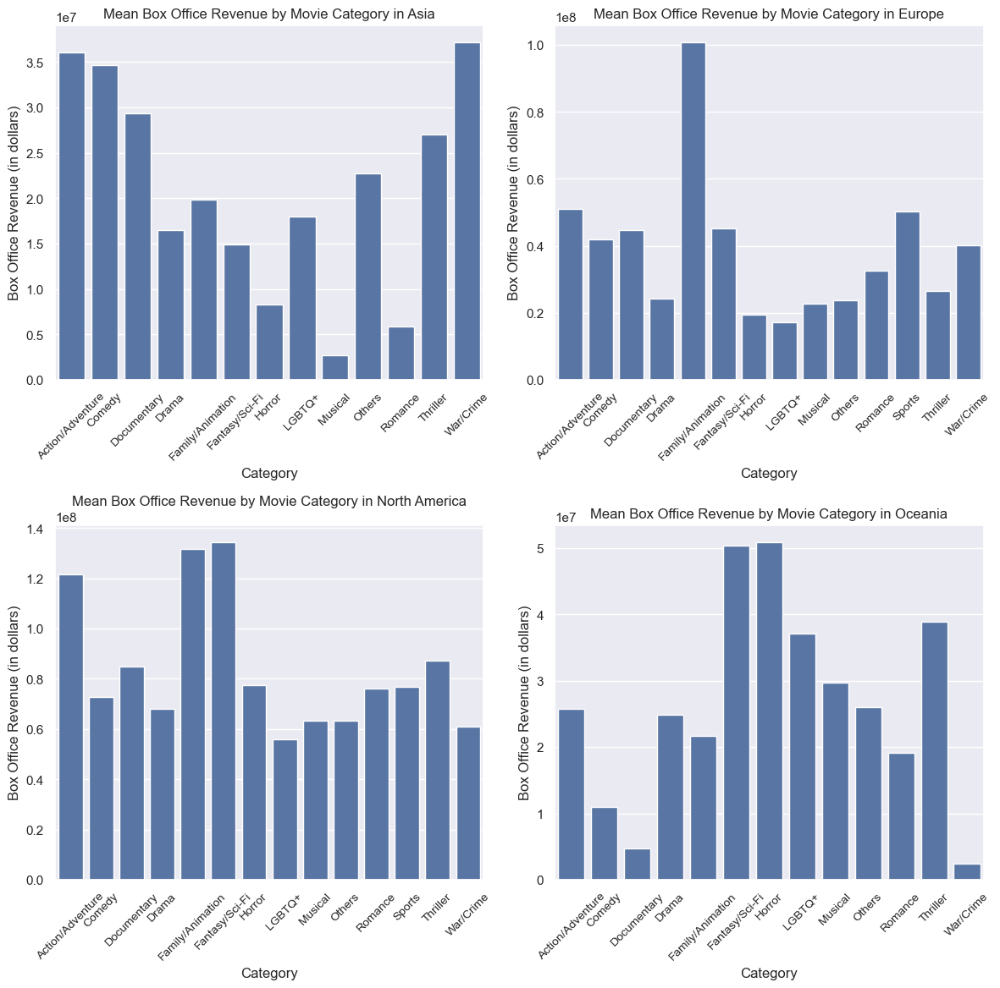

In [26]:
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.ravel()
for ax, continent in zip(axes, continents):
    df = df_boxoffice_mean_by_category_and_genre[df_boxoffice_mean_by_category_and_genre['continent'] == continent]
    sns.barplot(data=df, x="category", y="Movie_box_office_revenue", ax=ax)

    ax.set_title(f"Mean Box Office Revenue by Movie Category in {continent}")
    ax.set_xlabel("Category")
    ax.set_ylabel("Box Office Revenue (in dollars)")
    ax.tick_params(axis='x', rotation=45, labelright=False, labelsize=10)
plt.tight_layout()

In [162]:
emotion_columns = ['anger', 'disgust', 'fear', 'joy', 'neutral', 'sadness', 'surprise']
categories = ['Drama', 'Comedy', 'Thriller', 'Action/Adventure', 'Romance', 'Family/Animation']

#keep only the films that are in categories
data = interpolated_df.groupby('Wikipedia_movie_ID').mean()
data = data.merge(df_metadata[['Wikipedia_movie_ID', 'category']], on='Wikipedia_movie_ID')
data = data.explode('category')
data_with_category = data[data['category'].isin(categories)].dropna()
#a movie can be in more than 1 categories, so we need to keep only 1 sample per movie (hence drop_duplicates())
data = data_with_category.drop(['category', 'timestep', 'neutral'], axis=1).drop_duplicates()
data_with_category = data_with_category['category']

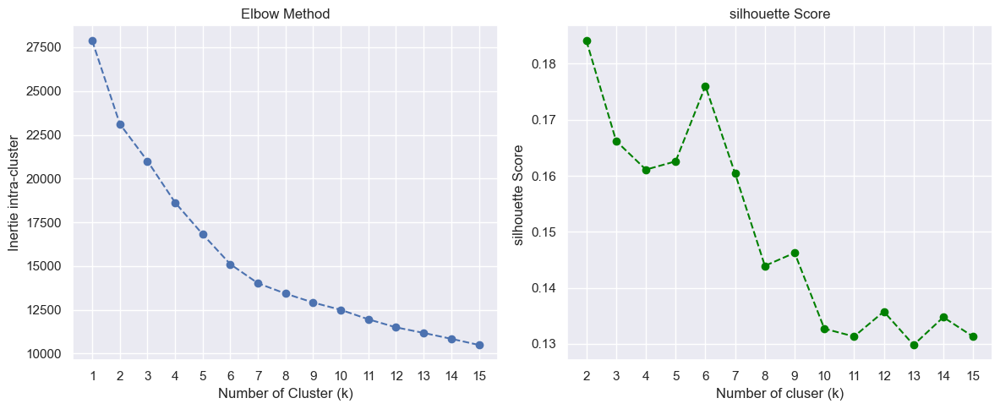

In [163]:
#kmeans
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

scaler = StandardScaler()
data_scaled = scaler.fit_transform(data.drop('Wikipedia_movie_ID', axis=1))

inertias = []
silhouette_scores = []
k_values = range(1, 16) 

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(data_scaled)
    
    inertias.append(kmeans.inertia_)
    #k=1 does not work with the silhouette score
    if k > 1:
        silhouette_avg = silhouette_score(data_scaled, labels)
        silhouette_scores.append(silhouette_avg)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(k_values, inertias, marker='o', linestyle='--')
plt.title('Elbow Method')
plt.xlabel('Number of Cluster (k)')
plt.ylabel('Inertie intra-cluster')
plt.xticks(k_values)
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(k_values[1:], silhouette_scores, marker='o', linestyle='--', color='green') 
plt.title('silhouette Score')
plt.xlabel('Number of cluser (k)')
plt.ylabel('silhouette Score ')
plt.xticks(k_values[1:])
plt.grid(True)

plt.tight_layout()
plt.show()


c'est marrant psq il faudrait prendre k=2, mais k=6 est le 2ème pic le plus haut et on a  choisi de garder que 6 catégories

In [164]:
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D  

data_kmeans = data.copy(deep=True)

n_clusters = 6
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(data_scaled)

data_kmeans['cluster_km'] = clusters

pca = PCA(n_components=3)
data_3d = pca.fit_transform(data_kmeans.drop(['Wikipedia_movie_ID', 'cluster_km'], axis=1))
data_kmeans['PCA1_km'] = data_3d[:, 0]
data_kmeans['PCA2_km'] = data_3d[:, 1]
data_kmeans['PCA3_km'] = data_3d[:, 2]
data_kmeans = data_kmeans.merge(df_metadata[['Wikipedia_movie_ID', 'category']], on='Wikipedia_movie_ID')

In [165]:
import plotly.express as px

plotly_data = pd.DataFrame({
    'PCA1_km': data_kmeans['PCA1_km'],
    'PCA2_km': data_kmeans['PCA2_km'],
    'PCA3_km': data_kmeans['PCA3_km'],
    'Cluster_km': data_kmeans['cluster_km'].astype(str),
    'Wikipedia_movie_ID': data_kmeans['Wikipedia_movie_ID'],
    'category': data_kmeans['category'] 
})

fig = px.scatter_3d(
    plotly_data,
    x='PCA1_km',
    y='PCA2_km',
    z='PCA3_km',
    color='Cluster_km',
    title='Clustering emotions in 3D (KMeans)',
    labels={'Cluster': 'Cluster_km'},
    opacity=0.7,
    width=1000,
    height=800,
    hover_data=["Wikipedia_movie_ID", "category"]
)

fig.show()


In [166]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np

# Global Pie Chart with Plotly
labels, counts = np.unique(data_with_category, return_counts=True)
fig_global = go.Figure(
    data=[go.Pie(labels=labels, values=counts, hole=0.3, marker=dict(colors=plt.cm.Paired.colors))],
)
fig_global.update_layout(
    title_text="Overall Category Distribution",
    showlegend=True
)
fig_global.show()

# Cluster-Specific Pie Charts with Plotly
data_kmeans = data_kmeans.explode('category')
data_kmeans = data_kmeans[data_kmeans['category'].isin(categories)]
category_per_cluster = data_kmeans[['cluster_km', 'category']].groupby('cluster_km').value_counts()
clusters = category_per_cluster.index.get_level_values('cluster_km').unique()
n_clusters = len(clusters)

# Create a subplot layout with 2 pies per row
fig = make_subplots(
    rows=(n_clusters + 1) // 2,  
    cols=2,
    specs=[[{'type': 'domain'}, {'type': 'domain'}] for _ in range((n_clusters + 1) // 2)],  # Domain type for pie charts
    subplot_titles=[f"Cluster {cluster+1}" for cluster in clusters]  
)

# Add pie charts to subplots
row, col = 1, 1
for cluster in clusters:
    cluster_data = category_per_cluster.loc[cluster]  # Filter the data for the current cluster
    fig.add_trace(
        go.Pie(
            labels=cluster_data.index.get_level_values('category'),
            values=cluster_data.values,
            name=f"Cluster {cluster}"
        ),
        row=row,
        col=col
    )
    col += 1
    if col > 2:  
        row += 1
        col = 1

# Update layout
fig.update_layout(
    title_text="Clusters - Repartition per categorie",
    height=300 * ((n_clusters + 1) // 2),  # Adjust height dynamically based on rows
    showlegend=True
)

# Show the figure
fig.show()


In [149]:
category_cluster_counts = data_kmeans.groupby(['category', 'cluster_km']).size().reset_index(name='count')
categories = category_cluster_counts['category'].unique()

fig = make_subplots(
    rows=(len(categories) + 1) // 2,  
    cols=2,  
    specs=[[{'type': 'domain'}, {'type': 'domain'}] for _ in range((len(categories) + 1) // 2)],
    subplot_titles=categories  
)

row, col = 1, 1
for category in categories:
    category_data = category_cluster_counts[category_cluster_counts['category'] == category]
    fig.add_trace(
        go.Pie(
            labels=category_data['cluster_km'].astype(str), 
            values=category_data['count'],  
            name=category,  
            textinfo='percent+label'  
        ),
        row=row,
        col=col
    )
    col += 1
    if col > 2:  
        row += 1
        col = 1

fig.update_layout(
    title="Cluster repartition per category",
    height=300 * ((len(categories) + 1) // 2),  
    showlegend=True
)

fig.show()

In [131]:
from sklearn.manifold import TSNE
import plotly.express as px

# dimension reduction with TSNE
tsne = TSNE(n_components=3, random_state=42, perplexity=5)
data_tsne_3d = tsne.fit_transform(data_scaled)

n_clusters = 7
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(data_tsne_3d)

data_tsne_km = pd.DataFrame(data_tsne_3d, columns=['Dim1', 'Dim2', 'Dim3'])
data_tsne_km['cluster_tsne'] = clusters
data_tsne_km['cluster_tsne'] = data_tsne_km['cluster_tsne'].astype(str)  
data_tsne_km.index = data.index  
data_tsne_km = data_tsne_km.merge(
    df_metadata[['Wikipedia_movie_ID', 'category']],
    left_index=True,
    right_index=True
)
fig = px.scatter_3d(
    data_tsne_km,
    x='Dim1',
    y='Dim2',
    z='Dim3',
    color='cluster_tsne',
    title='Clusters after reduction with t-SNE and KMeans (3D)',
    labels={'Cluster': 'cluster_tsne'},
    opacity=0.8,
    hover_data=['Wikipedia_movie_ID', 'category']  
)

fig.update_traces(marker=dict(size=5, line=dict(width=1, color='DarkSlateGrey')))
fig.update_layout(
    width=1000,  
    height=700, 
    legend_title_text='Cluster'
)
fig.show()


In [132]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

data_tsne = data_tsne.explode('category')
data_tsne = data_tsne[data_tsne['category'].isin(categories)]

category_per_cluster = data_tsne[['cluster_tsne', 'category']].groupby(['cluster_tsne', 'category']).value_counts()
category_per_cluster = category_per_cluster.reset_index(name='count')

clusters = category_per_cluster['cluster_tsne'].unique().astype(int)
n_clusters = len(clusters)

fig = make_subplots(
    rows=(n_clusters + 1) // 2,  
    cols=2,
    specs=[[{'type': 'domain'}, {'type': 'domain'}] for _ in range((n_clusters + 1) // 2)],  
    subplot_titles=[f"Cluster {cluster+1}" for cluster in clusters]
)

row, col = 1, 1
for cluster in clusters:
    cluster_data = category_per_cluster[category_per_cluster['cluster_tsne'].astype(int) == cluster]
    
    fig.add_trace(
        go.Pie(
            labels=cluster_data['category'],
            values=cluster_data['count'],
            name=f"Cluster {cluster}"
        ),
        row=row,
        col=col
    )
    
    col += 1
    if col > 2:  
        row += 1
        col = 1

fig.update_layout(
    title_text="Clusters - repartition per categorie using tsne and kmeans",
    height=300 * ((n_clusters + 1) // 2),  
    showlegend=True
)

fig.show()


In [145]:
category_cluster_counts = data_tsne.groupby(['category', 'cluster_tsne']).size().reset_index(name='count')
categories = category_cluster_counts['category'].unique()

fig = make_subplots(
    rows=(len(categories) + 1) // 2,  
    cols=2,  
    specs=[[{'type': 'domain'}, {'type': 'domain'}] for _ in range((len(categories) + 1) // 2)],
    subplot_titles=categories  
)

row, col = 1, 1
for category in categories:
    category_data = category_cluster_counts[category_cluster_counts['category'] == category]
    fig.add_trace(
        go.Pie(
            labels=category_data['cluster_tsne'].astype(str), 
            values=category_data['count'],  
            name=category,  
            textinfo='percent+label'  
        ),
        row=row,
        col=col
    )
    col += 1
    if col > 2:  
        row += 1
        col = 1

fig.update_layout(
    title="Cluster repartition per category",
    height=300 * ((len(categories) + 1) // 2),  
    showlegend=True
)

fig.show()

In [133]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.001, min_samples=5)  # Ajustez eps et min_samples selon votre dataset
clusters = dbscan.fit_predict(data_tsne_3d)

data_tsne_dbscan = pd.DataFrame(data_tsne_3d, columns=['Dim1', 'Dim2', 'Dim3'])
data_tsne_dbscan['cluster_dbscan'] = clusters.astype(str) 
data_tsne_dbscan.index = data.index  
data_tsne_dbscan = data_tsne_dbscan.merge(
    df_metadata[['Wikipedia_movie_ID', 'category']],
    left_index=True,
    right_index=True
)

# Création d'un graphique 3D avec Plotly
fig = px.scatter_3d(
    data_tsne_dbscan,
    x='Dim1',
    y='Dim2',
    z='Dim3',
    color='cluster_dbscan',  # Coloration selon les clusters DBSCAN
    title='Clusters after reduction with t-SNE and DBSCAN (3D)',
    labels={'Cluster': 'cluster_dbscan'},
    opacity=0.8,
    hover_data=['Wikipedia_movie_ID', 'category']  # Données supplémentaires survolées
)

# Personnalisation du graphique
fig.update_traces(marker=dict(size=5, line=dict(width=1, color='DarkSlateGrey')))
fig.update_layout(
    width=1000,  
    height=700, 
    legend_title_text='Cluster'
)
fig.show()


Dans l'état actuelle des choses, le clustering ne sert à rien et ne nous permet rien